# NEMA Reco

Prototype NEMA reconstruction functions

In [1]:
import Pkg

In [2]:
Pkg.add.(["HTTP", "Plots", "DataFrames", "HDF5","DrWatson", "StatsBase"]);

In [3]:
Pkg.add.(["Test"]);

In [4]:
using HTTP
using Plots
using DataFrames
using HDF5
using DrWatson
using Test

In [5]:
using Glob
using CSV

In [6]:
using Statistics
using StatsBase
using Printf

In [28]:
using Logging

In [7]:
@quickactivate "JPetalo"

In [8]:
pwd()

"/Users/jj/JuliaProjects/JPetalo/notebooks"

In [9]:
datadir()

"/Users/jj/JuliaProjects/JPetalo/data"

In [10]:
srcdir()

"/Users/jj/JuliaProjects/JPetalo/src"

In [11]:
include(srcdir("jpetalo.jl"))

Main.JPetalo

In [26]:
function loglevel(log)
    if log == "Debug"
        logger = SimpleLogger(stdout, Logging.Debug)
    elseif log =="Info"
        logger = SimpleLogger(stdout, Logging.Info)
    else
        logger = SimpleLogger(stdout, Logging.Warn)
    end
    old_logger = global_logger(logger)
end

loglevel (generic function with 1 method)

In [12]:
path = datadir("nema3-vac-1m/nema3-vac-1m-0.h5")

"/Users/jj/JuliaProjects/JPetalo/data/nema3-vac-1m/nema3-vac-1m-0.h5"

In [13]:
fid = h5open(path, "r") 

🗂️ HDF5.File: (read-only) /Users/jj/JuliaProjects/JPetalo/data/nema3-vac-1m/nema3-vac-1m-0.h5
└─ 📂 MC
   ├─ 🔢 configuration
   ├─ 🔢 hits
   ├─ 🔢 primaries
   ├─ 🔢 process_names
   ├─ 🔢 sensor_xyz
   ├─ 🔢 total_charge
   ├─ 🔢 vertices
   ├─ 🔢 volume_names
   └─ 🔢 waveform

### Read data into pdf

In [14]:
pdf = JPetalo.read_abc(path);

### Represent positions SiPMs

In [15]:
psipm_xy = scatter(pdf.sensor_xyz.x, pdf.sensor_xyz.y, 
                   title = "XY positions SiPMs", leg=false, fmt = :png);
xlabel!("x (mm)");
ylabel!("y (mm)");

In [16]:
psipm_xz = scatter(pdf.sensor_xyz.x, pdf.sensor_xyz.z, 
    title = "XZ positions SiPMs", leg=false, fmt = :png);
xlabel!("x (mm)");
ylabel!("z (mm)");

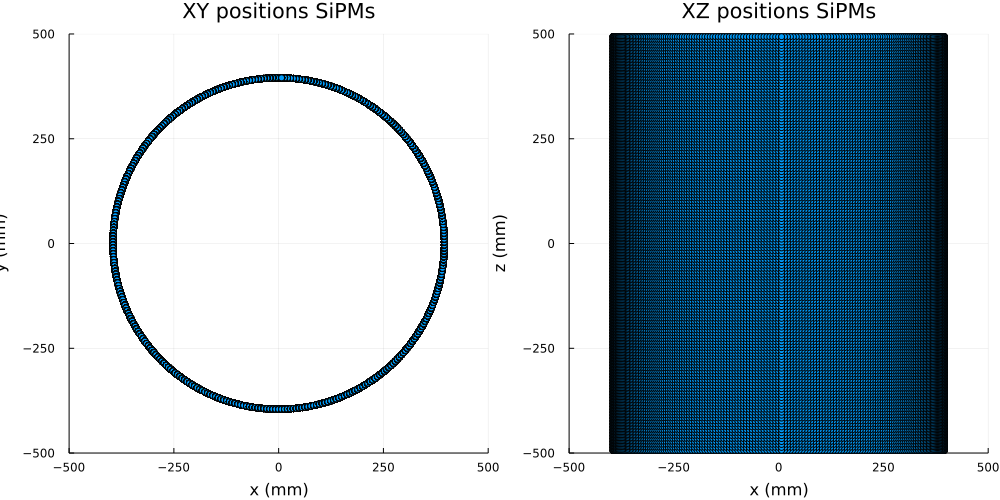

In [17]:
plot(psipm_xy,psipm_xz, layout = (1, 2), aspect_ratio=:equal, xlim=(-500.0, 500.0), 
		ylim=(-500.0, 500.0), size = (1000, 500), legend=false, fmt = :png)

### Position of sources

In [18]:
p_xy = scatter(pdf.primaries.x, pdf.primaries.y, title = "XY primary ", 	
                   leg=false, fmt = :png);
p_xz = scatter(pdf.primaries.x, pdf.primaries.z, title = "XZ primary ", 
                   leg=false, fmt = :png);
p_yz = scatter(pdf.primaries.y, pdf.primaries.z, title = "YZ primary ", 
                   leg=false, fmt = :png);


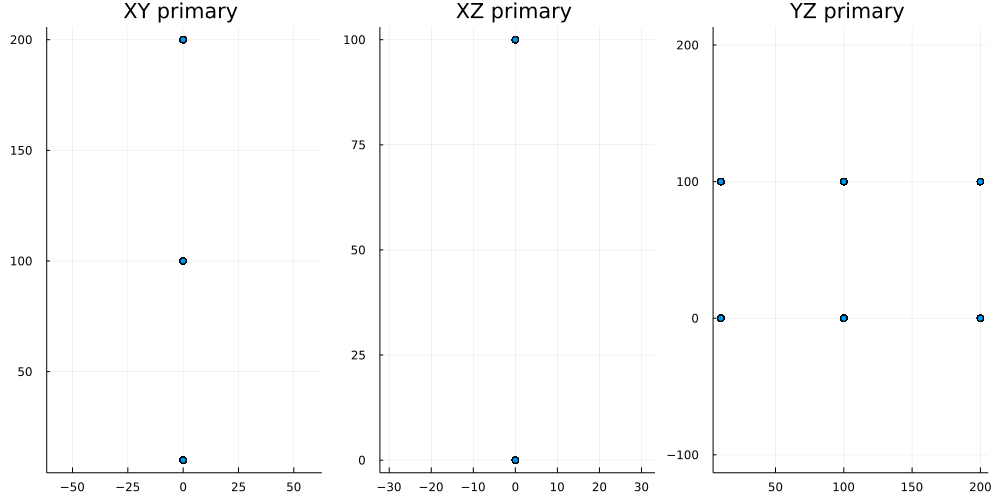

In [19]:
plot(p_xy,p_xz, p_yz, layout = (1, 3), 
    aspect_ratio=:equal,size = (1000, 500), legend=false, fmt = :png)


## Selection of events

In [20]:
function grfq(p::Vector{Float32})
	function rfq(q)
		return p[1] + p[2] * q
	end
	return rfq
end

# radius-from-zstd function. The parameters of the parabol have been
# obtained from a fit to photoelectric data.

function grfz(p::Vector{Float32})
	function rfz(z)
		return p[1] + p[2] * z + p[3] * z^2
	end
	return rfz
end

grfz (generic function with 1 method)

In [24]:
function rht(event::Integer, total_charge::DataFrame, sensor_xyz::DataFrame,
	         dc::JPetalo.DetConf)

	hitdf = JPetalo.rhits(event, dc.ecut, dc.pde,
	               total_charge, sensor_xyz)

	if nrow(hitdf) < 2
		@warn "Warning, hidtf is <2 for event = $event"
		return false
	end

	@info " hit dataframe: size = $size(hitdf)"
	@debug first(hitdf, 5)

	b1, b2, hq1df, hq2df = JPetalo.lor_kmeans(hitdf)
	@info " barycenters" b1 b2

	# total charge
	q1 = sum(hq1df.q)
	q2 = sum(hq2df.q)

	@info " total charge: q1 = $q1, q2 = $q2"
	if q1 < dc.qmin || q1 > dc.qmax
		return false
	end
	if q2 < dc.qmin || q2 > dc.qmax
		return false
	end

	return true
end



rht (generic function with 1 method)

In [21]:
function selph(file::String, dc::JPetalo.DetConf)

	evtdf = Dict("ntot" => 0, "nint"=> 0, "n2g"=> 0,
	            "nphot2" => 0, "nphot2r" => 0, "ncomp"=> 0, "ncompr"=> 0,
				"plst" =>[0], "clst" =>[0])

    @info "reading file $file"
	pdf = JPetalo.read_abc(file)            # read file
	dfs = JPetalo.primary_in_lxe(pdf.vertices)       # primary photons in LXe

	for event in unique(dfs.event_id)
        evtdf["ntot"]+=1
        vdf = JPetalo.select_by_column_value(dfs, "event_id", event)

        if nrow(vdf) > 0
            evtdf["nint"]+=1
            if any(vdf.track_id .== 1) && any(vdf.track_id .== 2)
                evtdf["n2g"]+=1
                df1 = JPetalo.select_by_column_value(vdf, "track_id", 1)
                df2 = JPetalo.select_by_column_value(vdf, "track_id", 2)

                if df1.process_id[1] == 1 && df2.process_id[1] == 1
                    evtdf["nphot2"]+=1
					reco = rht(event, pdf.total_charge, pdf.sensor_xyz, dc)
					if reco
						push!(evtdf["plst"],event)
						evtdf["nphot2r"]+=1
					end
                else
                    evtdf["ncomp"]+=1
					reco = rht(event, pdf.total_charge, pdf.sensor_xyz, dc)
					if reco
						push!(evtdf["clst"],event)
						evtdf["ncompr"]+=1
					end
                end
            end
        end
    end
    return evtdf
end


selph (generic function with 1 method)

In [22]:
pde  = 0.3f0
	sigma_tof = 0.085f0
	ecut = 3.0f0
	qmin = 1800.0f0
	qmax = 3000.0f0
	max_pes = 10
	ntof =5
	rfq = grfq([312.0f0, 0.027f0])
	rfz = grfq([395.6f0, -0.19f0, -0.037f0])
	dconf = JPetalo.DetConf(pde, sigma_tof, ecut, qmin, qmax, max_pes, ntof, rfq, rfz)

Main.JPetalo.DetConf(0.3f0, 0.085f0, 3.0f0, 1800.0f0, 3000.0f0, 10, 5, rfq, var"#rfq#1"{Vector{Float32}}(Float32[395.6, -0.19, -0.037]))

In [29]:
loglevel("Warn")

Base.CoreLogging.SimpleLogger(IJulia.IJuliaStdio{Base.PipeEndpoint}(IOContext(Base.PipeEndpoint(RawFD(44) open, 0 bytes waiting))), Info, Dict{Any, Int64}())

In [30]:
evtdf = selph(path, dconf)

┌ Warning: Warning, hidtf is <2 for event = 224
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 747
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 751
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 978
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 1226
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 2302
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 2781
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 3030
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 3594
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 4663
└ @ Main In[24]:8
┌ Warning: Warning, hidtf is <2 for event = 4742
└ @ Main In[24]:8


Dict{String, Any} with 9 entries:
  "ncompr"  => 562
  "ncomp"   => 1858
  "nphot2"  => 78
  "nphot2r" => 28
  "clst"    => [0, 0, 13, 15, 24, 26, 37, 41, 47, 81  …  4886, 4896, 4899, 4903…
  "plst"    => [0, 441, 905, 1047, 1114, 1223, 1298, 1316, 1339, 1375  …  3268,…
  "ntot"    => 3963
  "nint"    => 3963
  "n2g"     => 1936

In [31]:
evtdf

Dict{String, Any} with 9 entries:
  "ncompr"  => 562
  "ncomp"   => 1858
  "nphot2"  => 78
  "nphot2r" => 28
  "clst"    => [0, 0, 13, 15, 24, 26, 37, 41, 47, 81  …  4886, 4896, 4899, 4903…
  "plst"    => [0, 441, 905, 1047, 1114, 1223, 1298, 1316, 1339, 1375  …  3268,…
  "ntot"    => 3963
  "nint"    => 3963
  "n2g"     => 1936

In [19]:
rsipm = JPetalo.rxy(pdf.sensor_xyz.x[2],pdf.sensor_xyz.y[2])
@info "rsipm =" rsipm

┌ Info: rsipm =
│   rsipm = 395.4
└ @ Main In[19]:2


### Select primaries in LXe

In [20]:
vlxep = JPetalo.primary_in_lxe(pdf.vertices);

In [22]:
#show(vlxep, allcols=true) 

#### Conditions
- LXe           : volume_id = 0
- Primary       : parent_id = 0

In [23]:
@test all(vlxep.parent_id .== 0)

Test Passed

In [24]:
@test all(vlxep.volume_id .== 0)

Test Passed

## Selection algorithm by steps

In [32]:
zz = Dict("n"=>0)

Dict{String, Int64} with 1 entry:
  "n" => 0

In [33]:
zz["n"]+=1

1

In [34]:
zz

Dict{String, Int64} with 1 entry:
  "n" => 1

### Select photoelectric events and check that they are a 4 % of all the 2gammas

In [21]:
function select_ph(first, last, vlxep)
    nphot = 0
    nphot1 = 0
    nc = 0
    ntot  = 0
    n2g   = 0
    nint  = 0
    for event in first:last
        ntot+=1
        vdf = JPetalo.select_by_column_value(vlxep, "event_id", event)
        if nrow(vdf) > 0
            nint+=1
            if any(vdf.track_id .== 1) && any(vdf.track_id .== 2)
                n2g+=1
                df1 = JPetalo.select_by_column_value(vdf, "track_id", 1)
                df2 = JPetalo.select_by_column_value(vdf, "track_id", 2)
                if df1.process_id[1] == 1 && df2.process_id[1] == 1
                    nphot+=1
                elseif df1.process_id[1] == 1 || df2.process_id[1] == 1
                    nphot1+=1
                else
                    nc+=1
                end
            end
        end 
    end
    return ntot, nint, n2g, nphot, nphot1, nc
end
 

select_ph (generic function with 1 method)

In [22]:
ntot, nint, n2g, nphot, nphot1, nc = select_ph(0, 4900, vlxep)

(4901, 3886, 1893, 77, 664, 1152)

In [23]:
@printf("fraction of total gammas that interact in LXe = %.2f", nint/ntot)

fraction of total gammas that interact in LXe = 0.79

In [24]:
@printf("fraction of 2 gammas in LXe = %.2f", n2g/ntot)

fraction of 2 gammas in LXe = 0.39

In [25]:
@printf "fraction of photoelectric relative to events with 2 gammas = %.3f" nphot/n2g

fraction of photoelectric relative to events with 2 gammas = 0.041

In [26]:
@printf "fraction of 1 photoelectric relative to events with 2 gammas = %.3f" nphot1/n2g

fraction of 1 photoelectric relative to events with 2 gammas = 0.351

In [27]:
@printf "fraction of 0 photoelectric relative to events with 2 gammas = %.3f" nc/n2g

fraction of 0 photoelectric relative to events with 2 gammas = 0.609

## Reconstruction

In [30]:
detconf = "pde_0.3_sigmatof_85ps"
pde  = 0.3f0
sigma_tof = 0.085f0
ecut = 3.0f0
qmin = 1800.0f0
qmax = 3000.0f0
max_pes = 10
ntof =5
rfq = grfq([312.0f0, 0.027f0])
rfz = grfq([395.6f0, -0.19f0, -0.037f0])
dconf = JPetalo.DetConf(pde, sigma_tof, ecut, qmin, qmax, max_pes, ntof, rfq, rfz)

Main.JPetalo.DetConf(0.3f0, 0.085f0, 3.0f0, 1800.0f0, 3000.0f0, 10, 5, rfq, var"#rfq#1"{Vector{Float32}}(Float32[395.6, -0.19, -0.037]))

In [ ]:
reco(1, 4900, vlxhep, pdf, rsipm, dconf, phot=true, prt=false)

## Reconstruction of photoelectric events

In [33]:
function select_reco_pe(first, last, vlxep, ecut=2.0, pde=0.3, prt=false)
    HITDF = []
    HQ1DF = []
    HQ2DF = []
    DF1 = []
    DF2 = []
    R1 = []
    R2 = []
    Q1 = []
    Q2 = []
    for event in first:last
        vdf = JPetalo.select_by_column_value(vlxep, "event_id", event)
        if any(vdf.track_id .== 1) && any(vdf.track_id .== 2)
            df1 = JPetalo.select_by_column_value(vdf, "track_id", 1)
            df2 = JPetalo.select_by_column_value(vdf, "track_id", 2)
            if df1.process_id[1] == 1 && df2.process_id[1] == 1
                hitdf = recohits(event, pdf.total_charge, pdf.sensor_xyz, pdf.waveform,
                                 ecut, pde, max_pes, sigma_tof)

                
                b1, b2, hq2df, hq1df = JPetalo.lor_kmeans(hitdf)
                
                println("--->event =", event)
                
                d1 = JPetalo.dxyz([b1.x, b1.y, b1.z], [df1.x[1], df1.y[1], df1.z[1]])
                d2 = JPetalo.dxyz([b1.x, b1.y, b1.z], [df2.x[1], df2.y[1], df2.z[1]])
                
                println("d1 =", d1, " d2 =", d2)
                println()
                
                if d2 < d1
                    xt2 = [df1.x[1], df1.y[1], df1.z[1]]
                    xt1 = [df2.x[1], df2.y[1], df2.z[1]]
                else
                    xt1 = [df1.x[1], df1.y[1], df1.z[1]]
                    xt2 = [df2.x[1], df2.y[1], df2.z[1]]
                end
                
                phistd1 = JPetalo.phistd(hq1df::DataFrame)
                phistd2 = JPetalo.phistd(hq2df::DataFrame)
                r1 = sqrt(xt1[1]^2 + xt1[2]^2)
                r2 = sqrt(xt2[1]^2 + xt2[2]^2)
                
                x1, y1, z1  = JPetalo.radial_correction(b1, r1, rsipm)
                x2, y2, z2  = JPetalo.radial_correction(b2, r2, rsipm)
                
                if prt
                    println("q1 =", sum(hq1df.q), " q2 =", sum(hq2df.q))
                    println("r1 =", r1, " r2 = ", r2)
                    println("phistd1 =", phistd1, " phistd2 = ", phistd2)

                    println("xt1 =", xt1[1], " yt1 =", xt1[2]," zt1 =", xt1[3])
                    println("xb1 =", b1.x, " yb1 =", b1.y, " zb1 =", b1.z)
                    println("xr1 =", x1, " yr1 = ", y1, " zr1 = ", z1)
                    println("++++dx1 =", xt1[1] - x1, " dy1 =", xt1[2] - y1," dz1 =", xt1[3] - z1, "++++")
                    println()

                    println("xt2 =", xt2[1], " yt2 =", xt2[2]," zt2 =", xt2[3])
                    println("xb2 =", b2.x, " yb2 =", b2.y, " zb2 =", b2.z)
                    println("xr2 =", x2, " yr2 = ", y2, " zr2 = ", z2)
                    println("+++dx2 =", xt2[1] - x2, " dy2 =", xt2[2] - y2," dz2 =", xt2[3] - z2, "++++")
                    println()
                end

                
                push!(HITDF, hitdf)
                push!(HQ1DF, hq1df)
                push!(HQ2DF, hq2df)
                
                push!(DF1, xt1)
                push!(DF2, xt2)
                
                push!(R1, [x1,y1,z1])
                push!(R2, [x2,y2,z2])
                
                push!(Q1, sum(hq1df.q))
                push!(Q2, sum(hq2df.q))
 
            end
        end
    end
    return HITDF, HQ1DF, HQ2DF, DF1, DF2, R1, R2, Q1, Q2
end

select_reco_pe (generic function with 4 methods)

In [34]:
function plot_xyz(hdf, hq1df, hq2df, th1, th2, r1, r2, qnorm1=50.0, qnorm2=50.0)

    #pxy = scatter(hdf.x,hdf.y, marker_z = hdf.q, markersize = hdf.q/qnorm,
      #            color = :blues,
      #            legend=false)
    
    pxy = scatter(hq1df.x, hq1df.y, marker_z = hq1df.q, markersize = hq1df.q/qnorm1,
                  color = :blues,
                  legend=false)
 
    pxy = scatter!(pxy, hq2df.x, hq2df.y, marker_z = hq2df.q, markersize = hq2df.q/qnorm2,
                  color = :greens,
                  legend=false)
 
    
    pxy = scatter!(pxy, [th1[1]],[th1[2]], markershape=:star5, markersize = 10.0, legend=false)
    pxy = scatter!(pxy, [th2[1]],[th2[2]], markershape=:star5, markersize = 10.0, legend=false)
    
    pxy = scatter!(pxy, [r1[1]],[r1[2]], markershape=:diamond, markersize = 10.0, legend=false)
    pxy = scatter!(pxy, [r2[1]],[r2[2]], markershape=:diamond, markersize = 10.0, legend=false)
 
    xlabel!("x")
    ylabel!("y")
    
    #pxz = scatter(hdf.x,hdf.z, marker_z = hdf.q, markersize = hdf.q/qnorm,
     #            color = :blues,
      #           legend=false)
    
    pxz = scatter(hq1df.x, hq1df.z, marker_z = hq1df.q, markersize = hq1df.q/qnorm1,
                  color = :blues,
                  legend=false)
 
    pxz = scatter!(pxz, hq2df.x, hq2df.z, marker_z = hq2df.q, markersize = hq2df.q/qnorm2,
                  color = :greens,
                  legend=false)
 
    pxz = scatter!(pxz, [th1[1]],[th1[3]], markershape=:star5, markersize = 10.0, legend=false)
    pxz = scatter!(pxz, [th2[1]],[th2[3]], markershape=:star5, markersize = 10.0, legend=false)
    pxz = scatter!(pxz, [r1[1]],[r1[3]], markershape=:diamond, markersize = 10.0, legend=false)
    pxz = scatter!(pxz, [r2[1]],[r2[3]], markershape=:diamond, markersize = 10.0, legend=false)
 
    xlabel!("x")
    ylabel!("z")
    
    #pyz = scatter(hdf.y,hdf.z, marker_z = hdf.q, markersize = hdf.q/qnorm,
     #             color = :blues,
     #             legend=false)
    pyz = scatter(hq1df.y, hq1df.z, marker_z = hq1df.q, markersize = hq1df.q/qnorm1,
                  color = :reds,
                  legend=false)
 
    pyz = scatter!(pyz, hq2df.y, hq2df.z, marker_z = hq2df.q, markersize = hq2df.q/qnorm2,
                  color = :greens,
                  legend=false)
 
    pyz = scatter!(pyz, [th1[2]],[th1[3]], markershape=:star5, markersize = 10.0, legend=false)
    pyz = scatter!(pyz, [th2[2]],[th2[3]], markershape=:star5, markersize = 10.0, legend=false)
    pyz = scatter!(pyz, [r1[2]],[r1[3]], markershape=:diamond, markersize = 10.0, legend=false)
    pyz = scatter!(pyz, [r2[2]],[r2[3]], markershape=:diamond, markersize = 10.0, legend=false)

    xlabel!("y")
    ylabel!("z")

    return pxy, pxz, pyz
end

plot_xyz (generic function with 3 methods)

In [35]:
HITDF, HQ1DF, HQ2DF, DF1, DF2, R1, R2, Q1, Q2 = select_reco_pe(0, 1000, vlxep);

--->event =28
d1 =31.120956 d2 =811.9333

--->event =342
d1 =36.13515 d2 =637.69916

--->event =441
d1 =797.1097 d2 =13.014566

--->event =558
d1 =20.537148 d2 =838.0108

--->event =563
d1 =30.865768 d2 =782.2506

--->event =636
d1 =1044.8317 d2 =28.423243

--->event =728
d1 =24.110643 d2 =1040.9203

--->event =729
d1 =863.3049 d2 =34.041874

--->event =854
d1 =37.42667 d2 =931.9298

--->event =905
d1 =21.886732 d2 =782.3266



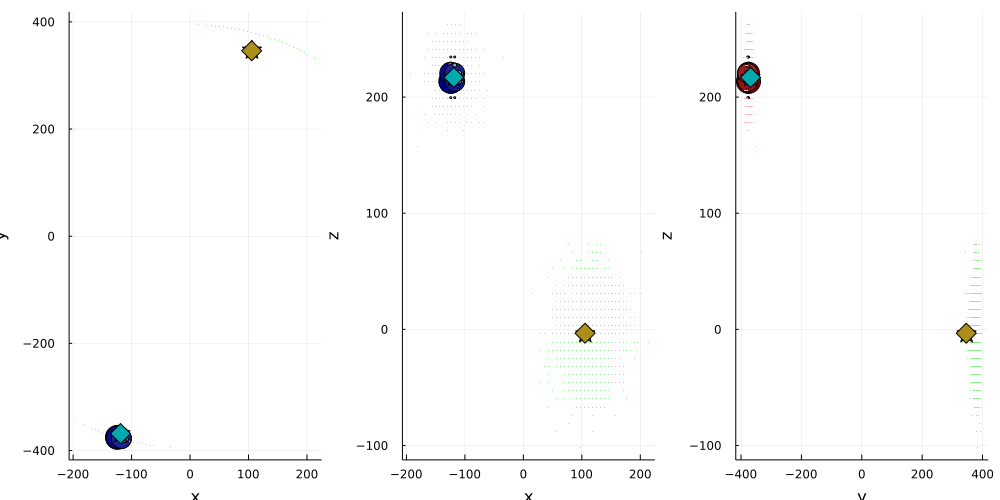

In [36]:
evt = 1
norm = 20.
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], norm, norm)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

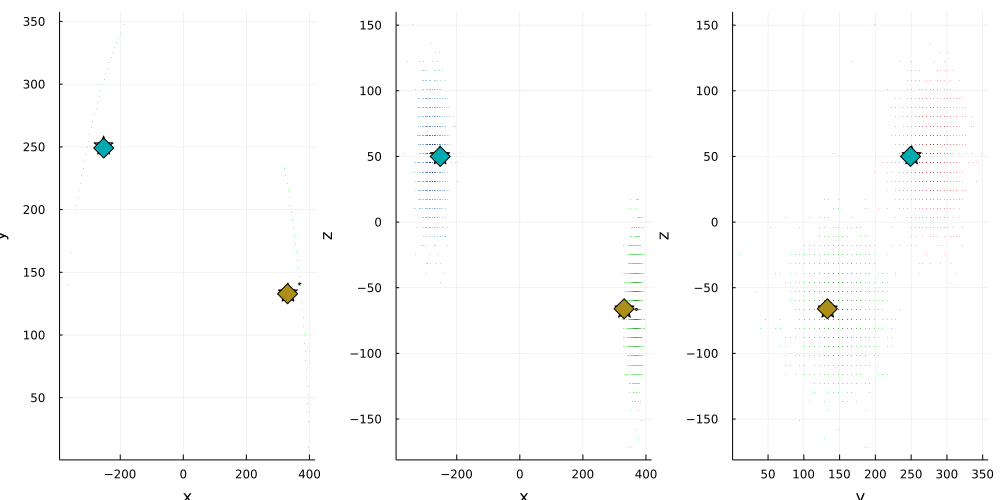

In [37]:
evt = 2
norm = 20
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], norm, norm)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

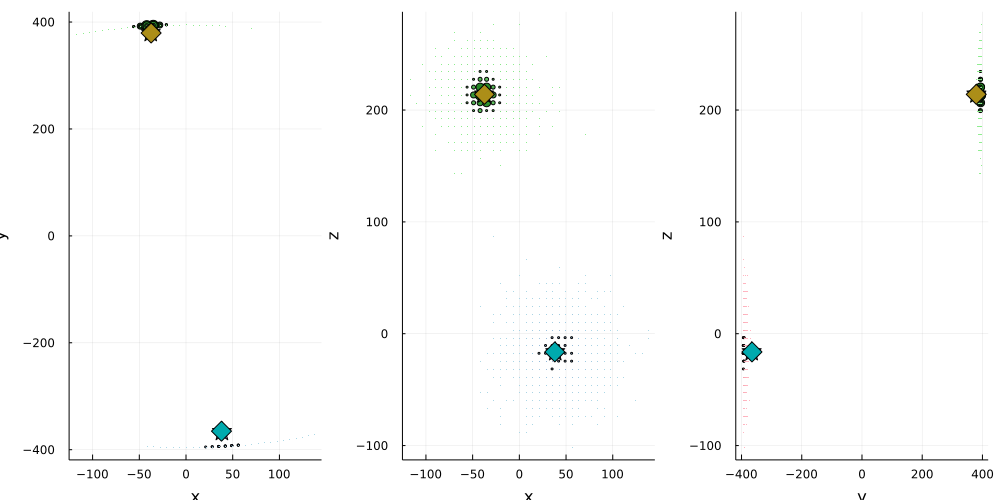

In [38]:
evt = 3
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

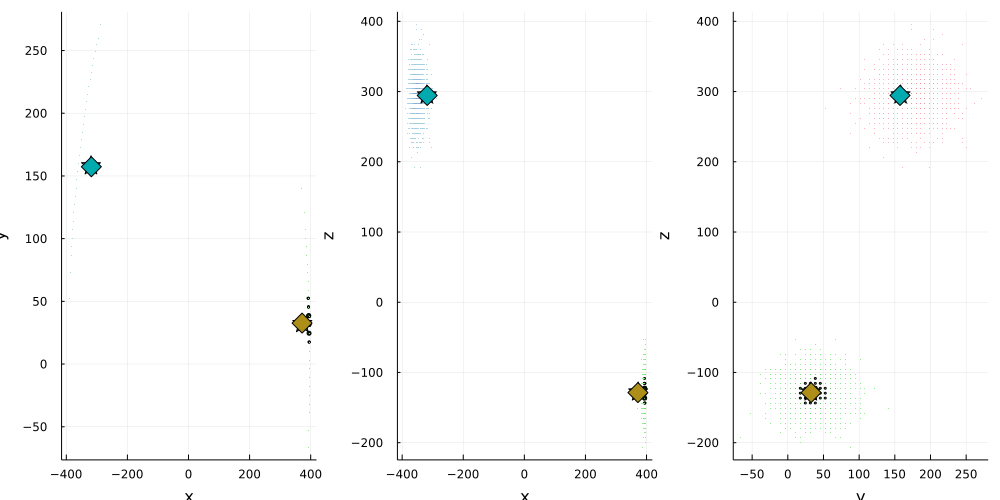

In [39]:
evt = 4
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

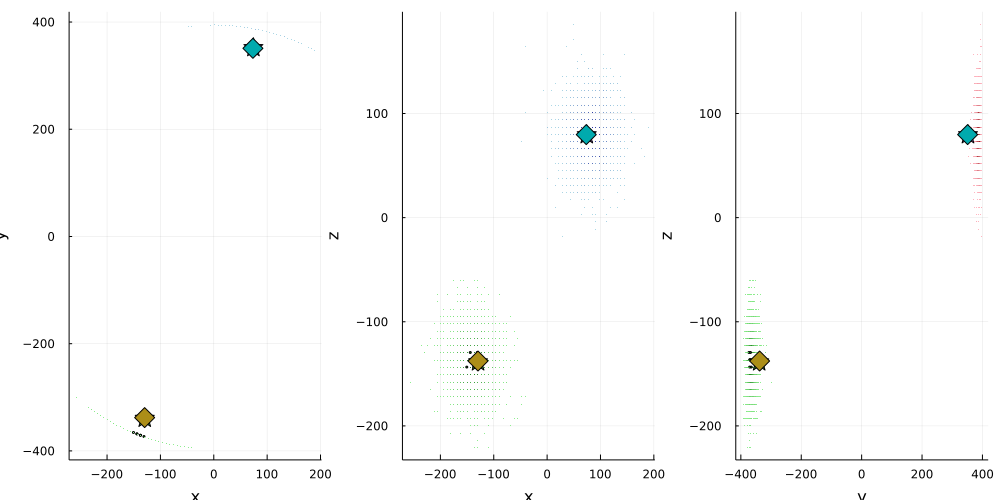

In [40]:
evt = 5
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

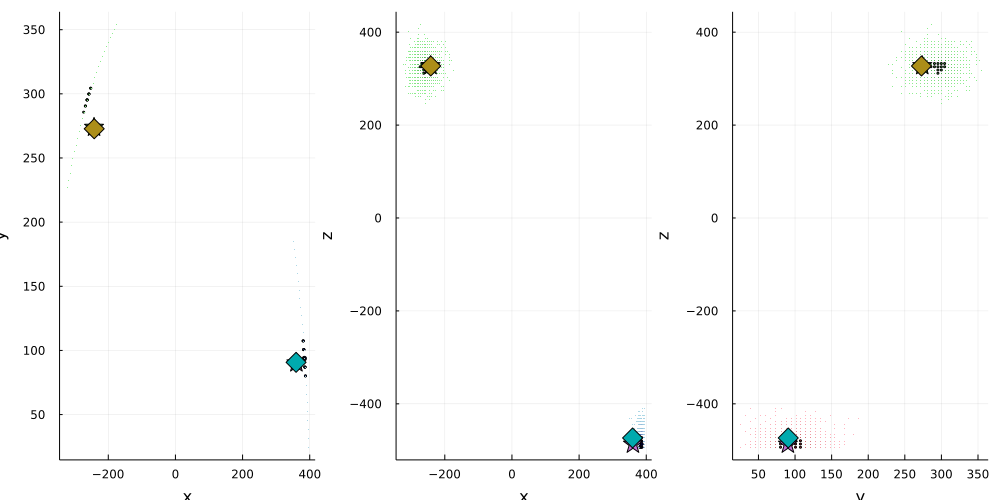

In [41]:
evt = 6
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

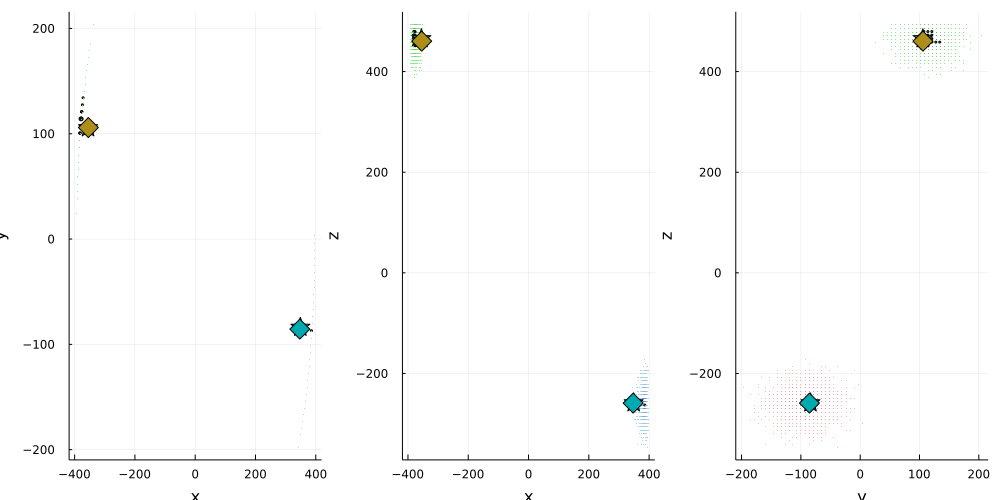

In [42]:
evt = 7
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

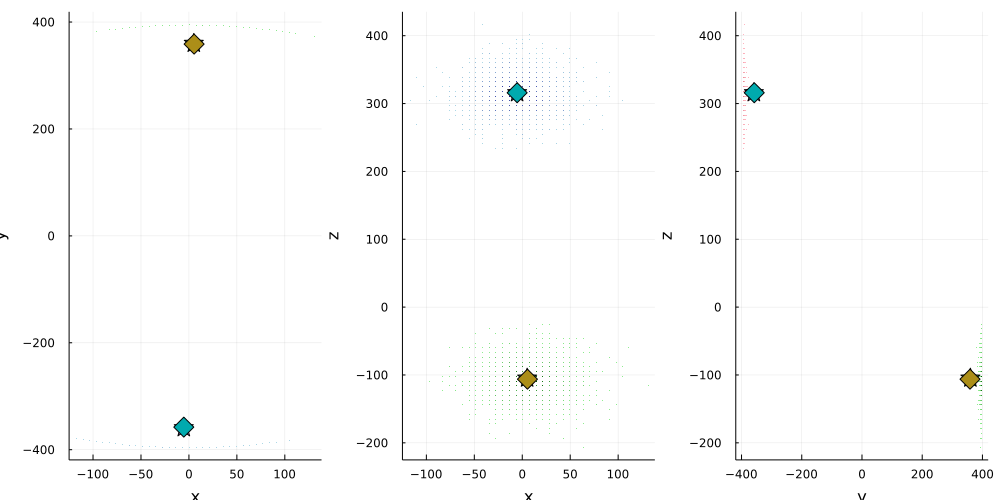

In [43]:
evt = 8
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

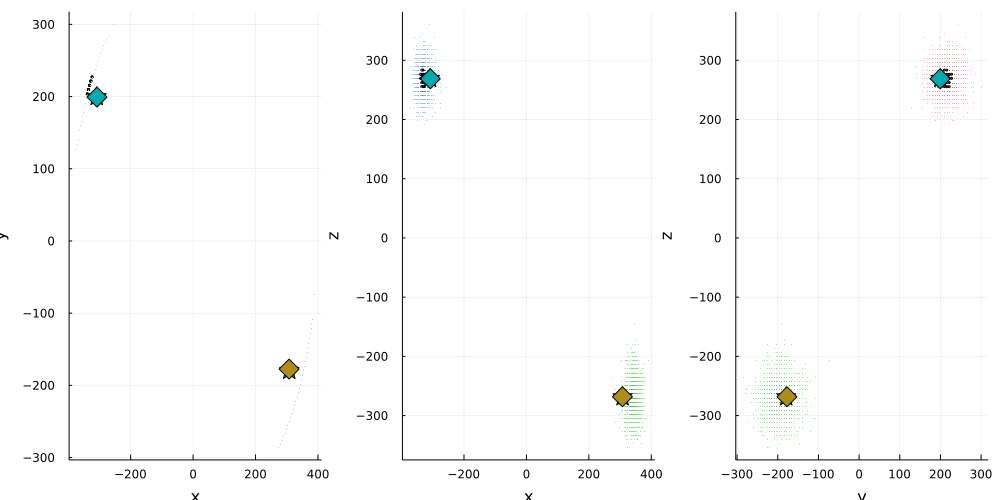

In [44]:
evt = 9
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

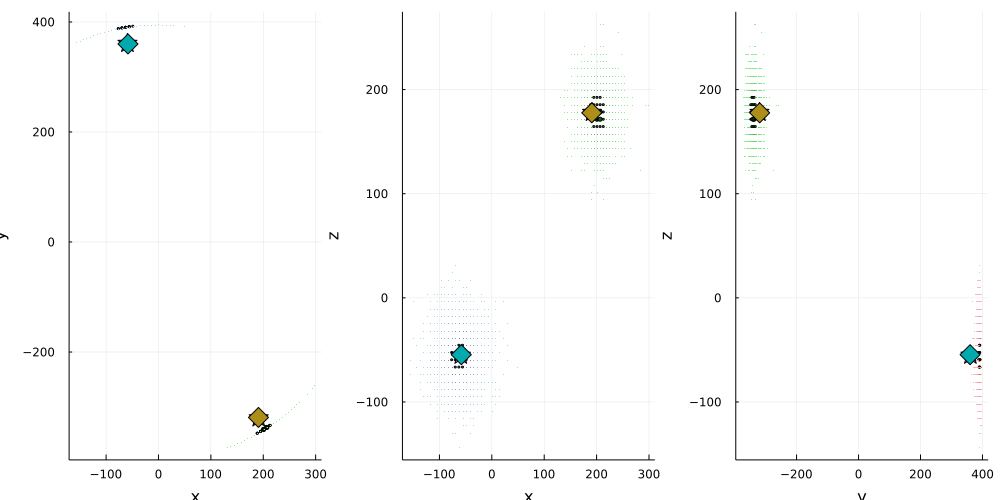

In [45]:
evt = 10
pxy, pxz, pyz = plot_xyz(HITDF[evt], HQ1DF[evt], HQ2DF[evt], DF1[evt], DF2[evt],R1[evt], R2[evt], 20., 20.)
plot(pxy, pxz, pyz,  layout = (1, 3), size = (1000, 500), 
     legend=false, fmt = :png)

# NEMA3

In [56]:
function n3plt(n3df)
    
  
    nsipm = histogram(n3df.nsipm, bins=30, legend=false)
    xlabel!("Number of SiPMs with Q > qc pes")
    ylabel!("Arbitrary units")
    
    qmx = histogram(n3df.qmx, xlim=(0.,100.),  legend=false)
    xlabel!("max Q in SiPMs (pes)")
    ylabel!("Arbitrary units")
 
    qav = histogram(n3df.qav, xlim=(0.,30.),  legend=false)
    xlabel!("average Q in SiPMs (pes)")
    ylabel!("Arbitrary units")
 
    q1 = histogram(n3df.q1, xlim=(0,4000), legend=false)
    xlabel!("Total Q in SiPMs (pes)")
    ylabel!("Arbitrary units")
 
    q12 = histogram2d(n3df.q1, n3df.q2, c = :blues, legend=false)
    xlabel!("Total Q in SiPMs (pes) hemisphere 1")
    ylabel!("Total Q in SiPMs (pes) hemisphere 2")
 
    #dxy = histogram(JPetalo.rxy.(n3df.dx,n3df.dy), bin=40, legend=false)
    #xlabel!("Dxy (mm)")
    #ylabel!("Arbitrary units")

    #phxy = histogram(phi.(n3df.dy,n3df.dx), legend=false)
    #xlabel!("Phi (mm)")
    #ylabel!("Arbitrary units")

    dz = histogram(n3df.dz, legend=false)
    xlabel!("Dz (mm)")
    ylabel!("Arbitrary units")
    
    phistd = histogram(n3df.phistd, xlim=(0.0,0.1), legend=false)
    xlabel!("phi (rad)")
    ylabel!("Arbitrary units")
 
    r = histogram(n3df.r, xlim=(350.0,400.0), legend=false)
    xlabel!("r (mm)")
    ylabel!("Arbitrary units")
 
    histogram2d(n3df.phistd, n3df.r, xlim=(0.0,0.1), ylim=(300.0,400.0), c=:blues, legend=false)
    
    n3pd = Dict("nsipm"=>nsipm, "qmx"=>qmx, "qav"=>qav, "q1"=>q1, "q12"=>q12, 
                "phstd"=>phistd, "r"=>r, "dz"=>dz)
    return n3pd
end

n3plt (generic function with 1 method)

In [80]:
drx = datadir("nema3df")
input = string(drx,"/nema3df_f10_q4_phot.csv")

"/Users/jj/JuliaProjects/JPetalo/data/nema3df/nema3df_f10_q4_phot.csv"

In [81]:
n3df = DataFrame(CSV.File(input));

In [82]:
names(n3df)

21-element Vector{String}:
 "dz"
 "nsipm"
 "phistd"
 "q1"
 "q2"
 "qav"
 "qmx"
 "r"
 "xr1"
 "xr2"
 "xt1"
 "xt2"
 "yr1"
 "yr2"
 "yt1"
 "yt2"
 "zr1"
 "zr2"
 "zstd"
 "zt1"
 "zt2"

In [83]:
n3pd = n3plt(n3df);

In [106]:
function qres(n3df, qmin, qmax)
    q1 = n3df.q1[n3df.q1 .> qmin]
    q2 = q1[q1 .< qmax]
    qm = mean(q2)
    sq = std(q2)
    return qm, sq, sq/qm
end

qres (generic function with 1 method)

In [107]:
qmean, qstd, sigma_over_mean = qres(n3df, 1000.0, 3000.0)

(1886.2810994325635, 404.21681368716827, 0.2142929883614727)

In [877]:
keys(n3pd)

KeySet for a Dict{String, Plots.Plot{Plots.GRBackend}} with 8 entries. Keys:
  "q1"
  "nsipm"
  "qmx"
  "qav"
  "dz"
  "phxy"
  "q12"
  "dxy"

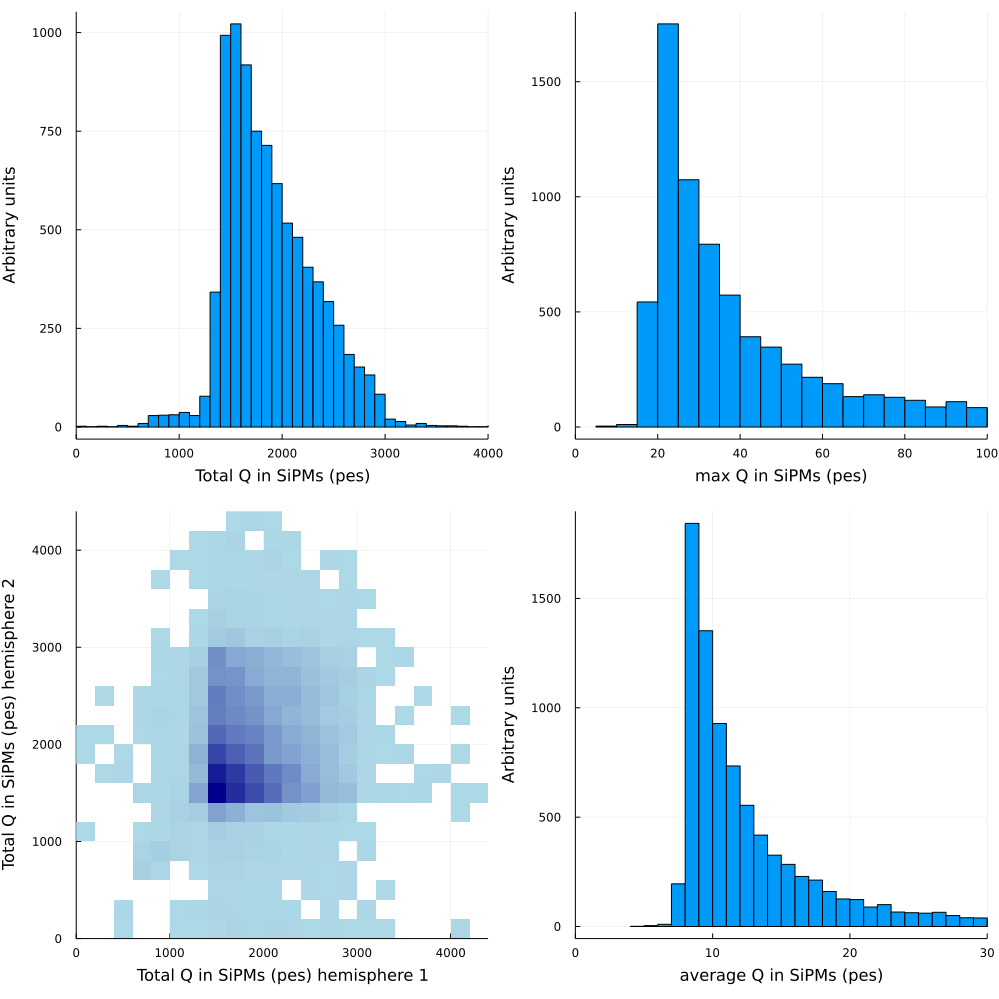

In [84]:
plot(n3pd["q1"], n3pd["qmx"], n3pd["q12"], n3pd["qav"],  layout = (2, 2), size = (1000, 1000), 
     legend=false, fmt = :png)

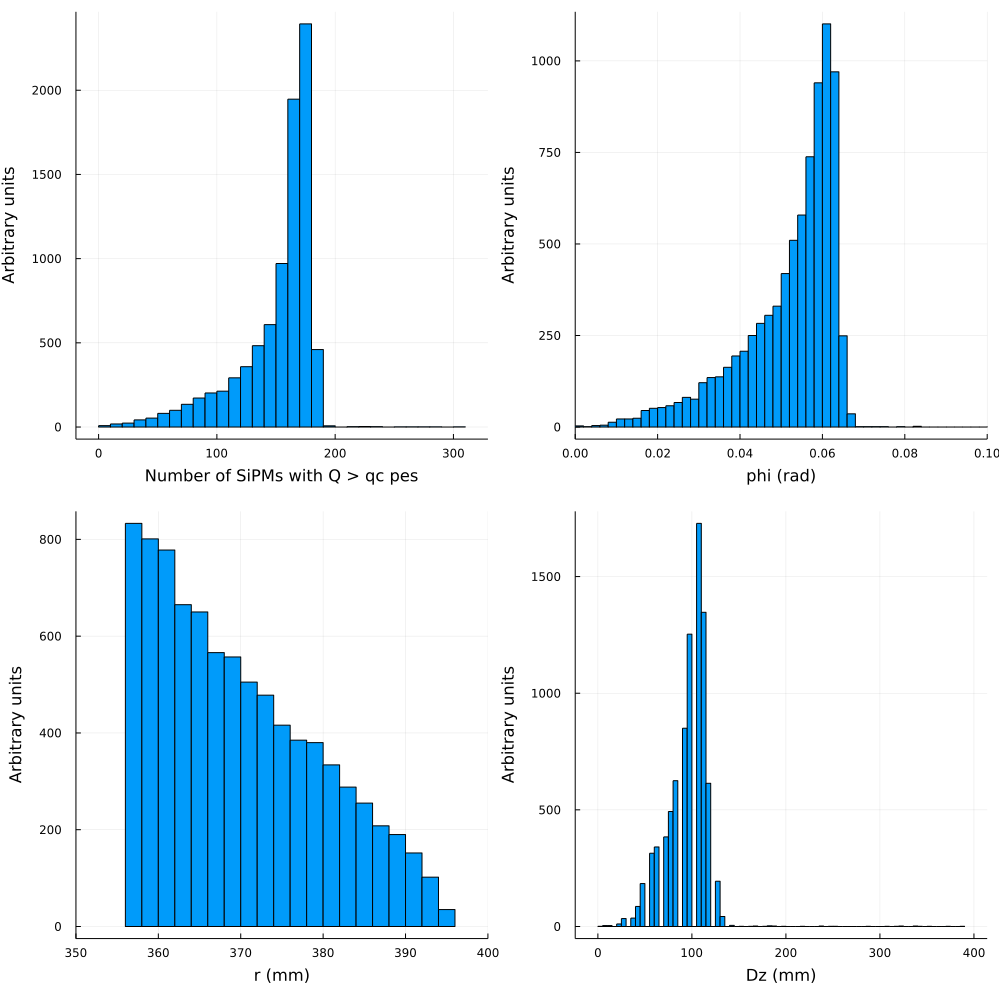

In [85]:
plot(n3pd["nsipm"], n3pd["phstd"], n3pd["r"], n3pd["dz"],  layout = (2, 2), size = (1000, 1000), 
     legend=false, fmt = :png)

In [ ]:
histogram2d(n3df.phistd.^2, n3df.r, xlim=(0.0,0.01), c=:blues, legend=false)

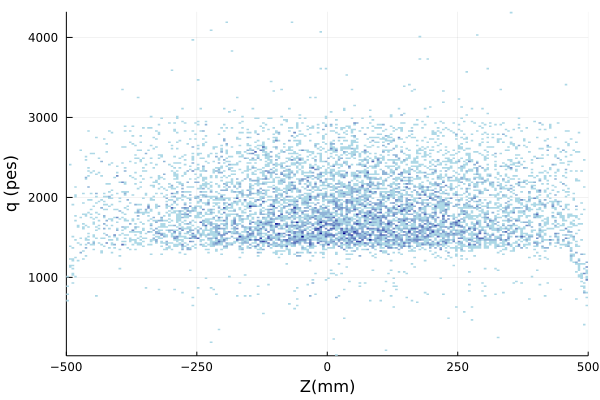

In [101]:
histogram2d(n3df.zt1, n3df.q1, bin=250, c=:blues, legend=false)
xlabel!("Z(mm)")
ylabel!("q (pes)")

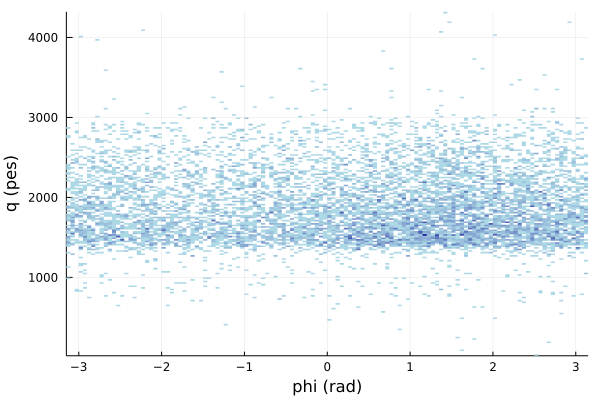

In [102]:
histogram2d(JPetalo.phixy.(n3df.xt1,n3df.yt1), n3df.q1, bin=250, c=:blues, legend=false)
xlabel!("phi (rad)")
ylabel!("q (pes)")

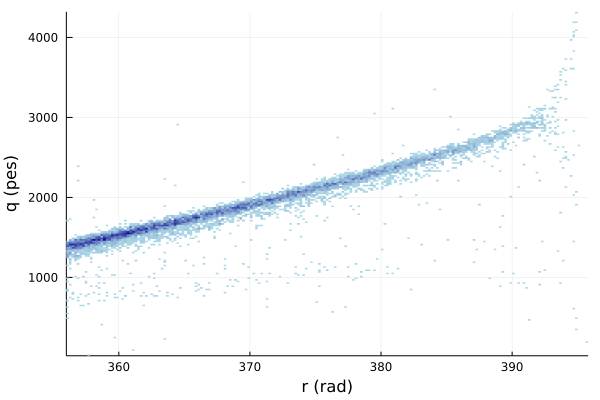

In [119]:
histogram2d(n3df.r, n3df.q1, bin=250, c=:blues, legend=false)
xlabel!("r (rad)")
ylabel!("q (pes)")

In [96]:
histogram(n3df.xr1 - n3df.xt1, xlim=(-10.0, 10.0), legend=false)
xlabel!("xr - xt (mm)")
ylabel!("Arbitrary units")

In [112]:
function xres(n3df, xmin, xmax)
    x1 = n3df.xr1 - n3df.xt1
    x2 = x1[x1 .> xmin]
    x3 = x2[x2 .< xmax]
    xm = mean(x3)
    sx = std(x3)
    return xm, sx
end

xres (generic function with 1 method)

In [113]:
xres(n3df, -3.0, 3.0)

(0.0016842198362737833, 0.5798109541793217)

In [97]:
histogram(n3df.yr1 - n3df.yt1, xlim=(-10.0, 10.0), legend=false)
xlabel!("xr - xt (mm)")
ylabel!("Arbitrary units")

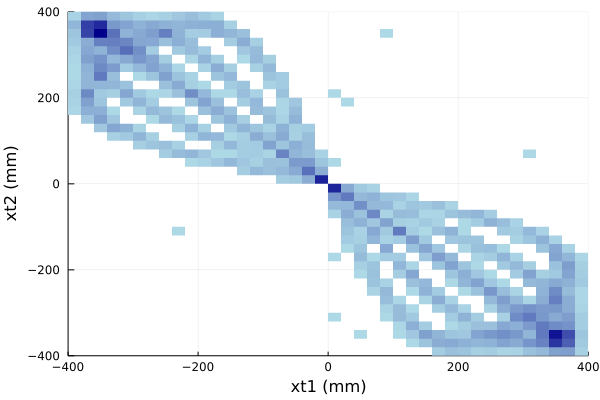

In [114]:
histogram2d(n3df.xt1, n3df.xt2, bin=50, c=:blues,legend=false)
xlabel!("xt1 (mm)")
ylabel!("xt2 (mm)")

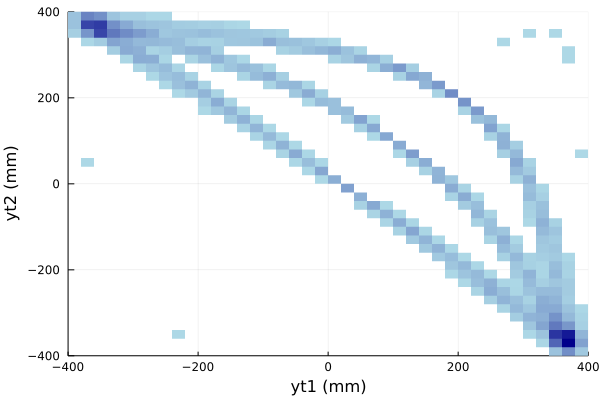

In [115]:
histogram2d(n3df.yt1, n3df.yt2, bin=50, c=:blues,legend=false)
xlabel!("yt1 (mm)")
ylabel!("yt2 (mm)")

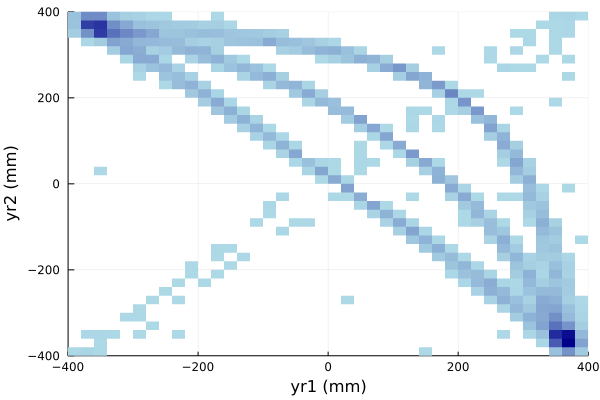

In [116]:
histogram2d(n3df.yr1, n3df.yr2, bin=50, c=:blues,legend=false)
xlabel!("yr1 (mm)")
ylabel!("yr2 (mm)")

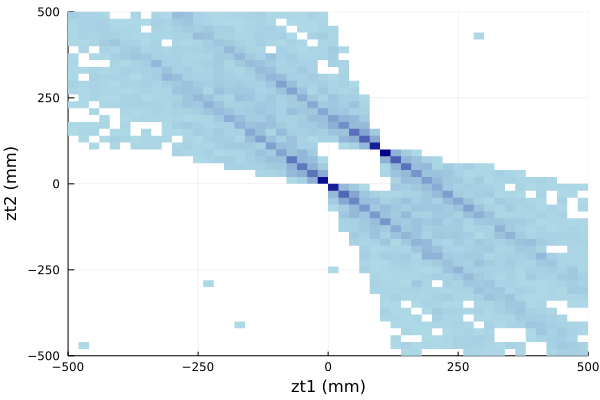

In [117]:
histogram2d(n3df.zt1, n3df.zt2, bin=50, c=:blues,legend=false)
xlabel!("zt1 (mm)")
ylabel!("zt2 (mm)")